<img src="./logo_UTN.svg" align="right" width="150" /> 
#### Documentacion Procesamiento de imagenes

# Introduccion al Procesamiento de Imagenes Orientado a Redes Profundas
#### Lucas Bautista


# Que es una imagen?

Se puede pensar a una imagen como un arreglo de 3 matrices, comúnmente denominado **tensor**,en donde cada una de estas se identifican con tres canales, en particular azul(b), rojo(r) y verde(g), en dichos elementos de cada matriz, se almacena el grado de intensidad lumínica que registra cada sensor óptico de cada uno de los canales, la composición de estos resultados y la adecuada codificación, generan las fotografías que observamos habitualmente,[mayor informacion capitulo 1 de este libro](http://the-eye.eu/public/Books/IT%20Various/Image%20Processing%2C%202nd%20Edition.pdf).

# Canales de una imagen

Es común pensar que cuando hablamos del canal rojo o azul de una imagen, si solo extraemos dicho elemento la imagen resultante se verá con un filtro de ese mismo canal, pues esto no es así ya que, como mencionamos anteriormente, los canales son valores de intensidad lumínica expresados de 0 a 255, para que exista color, es necesario realizar la composición, por lo que el resultado esperado es tener una imagen en un formato de escala de grises, dependiendo la intensidad del canal que se extrajo.

# Ejemplos con OpenCV 

## Carga de datos
Veamos un ejemplo de cómo cargar una imagen haciendo uso de OpenCV, primero que nada debemos saber en qué formato se carga la imagen, dentro de los formatos pueden diferenciarse según el orden de canal **rgb** o **bgr** que tiene que ver la forma en la que se ordenan las matrices en memoria y **channel last (chl) (fila,columna,canales)** o **channel first (chf) (canales,filas,columnas)** que tiene que ver con la forma en la que se estructuran los datos del tensor. OpenCV levanta las imágenes en formato *bgr chl* sin embargo matoplotlib trabaja con imagenes en formato *rgb chl* por lo que para visualizarlas es necesario invertir los canales del tensor, esta instruccion se realiza de forma optima mediante el operador **[:,:,::-1]** el cual invierte la priemra posicion por la ultima, y mantiene constante la del medio. de este modo *bgr* se convierte en *rgb*, se hace mencion ya que sera utilizado con mucha frecuencia. 

La imagen mide 1540X2080 pixeles y tiene 3 canales



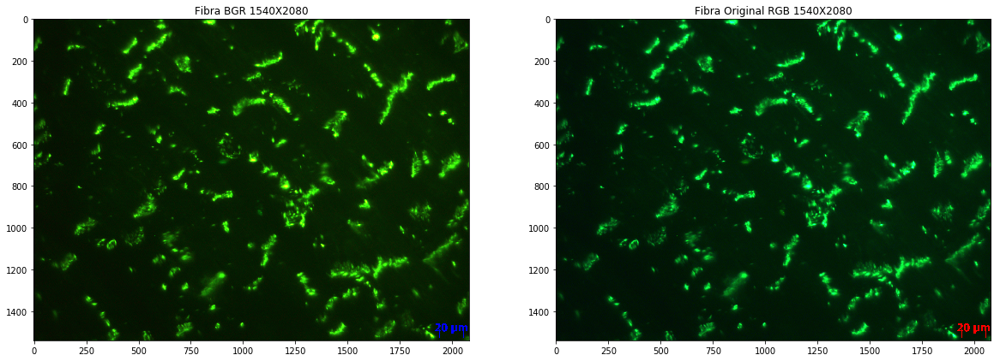

In [57]:
from __future__ import print_function
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import os
import matplotlib.animation as animation
import math
from IPython.display import HTML
import sys

im1 = cv2.imread("i2.tif") #cargamos la imagen
print("La imagen mide %sX%s pixeles y tiene %s canales\n"%(im1.shape))

plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.imshow(im1),plt.title("Fibra BGR %sX%s"%(im1.shape[0:2]))
plt.subplot(1,2,2)
plt.imshow(im1[:,:,::-1]),plt.title("Fibra Original RGB %sX%s"%(im1.shape[0:2])); #realizamos la operacion inversion


## Extraccion de Canales
Procedemos a extraer y mostrar los canales de la misma, nótese como la imagen en su mayoría es verde, por lo que es esperable que tanto canal rojo como azul se muestran muy apagados y en cambio el canal verde sea muy prendido, es decir se viera como si la imagen se le hubiese quitado el color. El resultado de la extraccion resulta en una imagen la cual ya no es mas un tensor sino que pasa a ser una matriz por ende solo tiene 1 canal.A modo ilustrativo se muestra la forma de realizar la extracción y lo sencilla e intuitiva que resulta si la imagen estuviera en *channel first* puesto que simplemente hay que indexar a una posición,esto es para comprender la motivación de trabajar en este formato, sobre todo cuando se tengan batches de imágenes que son **tensores**.

La imagen mide 1540X2080 pixeles y tiene 3 canales

La imagen mide 1540X2080 pixeles y tiene 1 canal

La imagen mide 1540X2080 pixeles y tiene 1 canal

La imagen mide 1540X2080 pixeles y tiene 1 canal



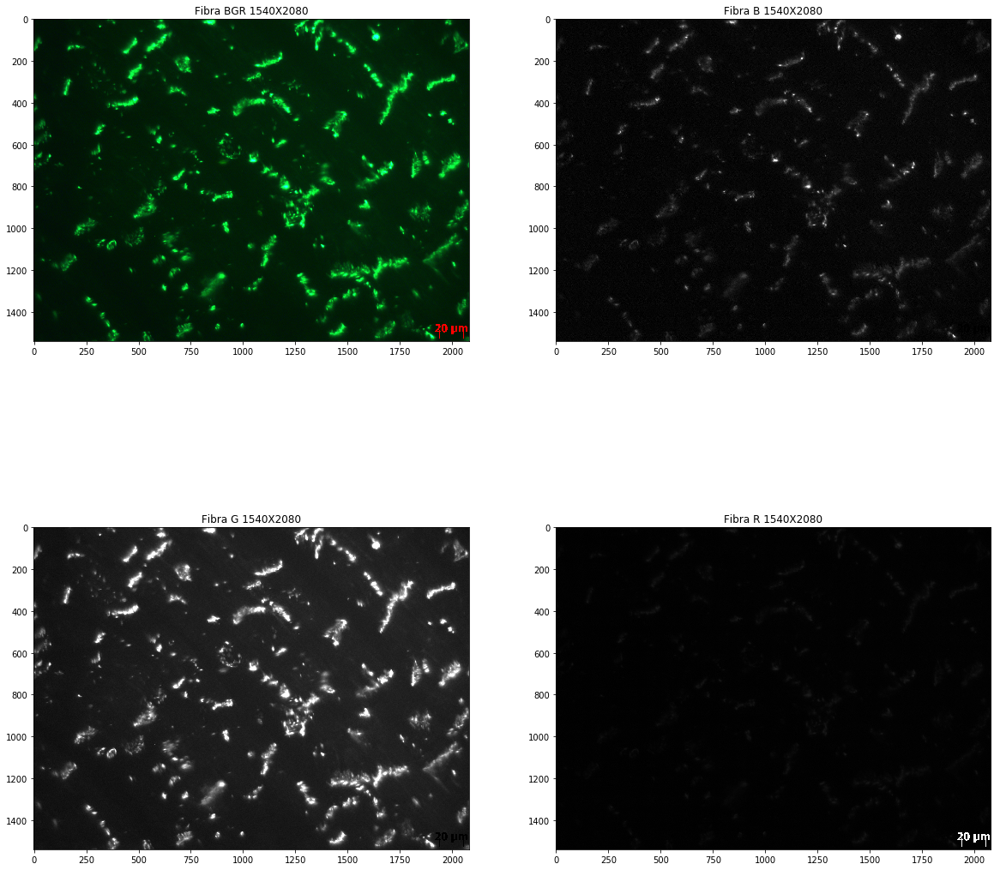

In [58]:
im1_b = im1[:,:,0] #extraccion canal azul
im1_g = im1[:,:,1] #extraccion canal verde
im1_r = im1[:,:,2] #extraccion canal rojo

#extraccion si la imagen estuviera en formato chf
#im1_b = im1[0] #extraccion canal azul
#im1_g = im1[1] #extraccion canal verde
#im1_r = im1[2] #extraccion canal rojo
print("La imagen mide %sX%s pixeles y tiene %s canales\n"%(im1.shape))
print("La imagen mide %sX%s pixeles y tiene 1 canal\n"%(im1_b.shape))
print("La imagen mide %sX%s pixeles y tiene 1 canal\n"%(im1_g.shape))
print("La imagen mide %sX%s pixeles y tiene 1 canal\n"%(im1_r.shape))

plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(im1[:,:,::-1],'gray'),plt.title("Fibra BGR %sX%s"%(im1.shape[0:2]))
plt.subplot(2,2,2)
plt.imshow(im1_b,'gray'),plt.title("Fibra B %sX%s"%(im1.shape[0:2]))
plt.subplot(2,2,3)
plt.imshow(im1_g,'gray'),plt.title("Fibra G %sX%s"%(im1.shape[0:2]))
plt.subplot(2,2,4)
plt.imshow(im1_r,'gray'),plt.title("Fibra R %sX%s"%(im1.shape[0:2]));

## Filtrado por Color
Para lograr el efecto de filtrado de canal en la imagen, es decir, obtener una imagen que sea solo roja,verde o azul, dependiendo de qué canal elijamos debemos anular, no extraer, los demas canales que no sean de interés, para ello creamos una copia y ponemos a 0 los valores de los demás canales, la diferencia con la operación anterior es que la imagen filtrada, aún preserva sus canales y es formato *rgb* o *bgr* es decir, sigue siendo un tensor y no una matriz.

La imagen mide 1540X2080 pixeles y tiene 3 canales

La imagen mide 1540X2080 pixeles y tiene 3 canales

La imagen mide 1540X2080 pixeles y tiene 3 canales



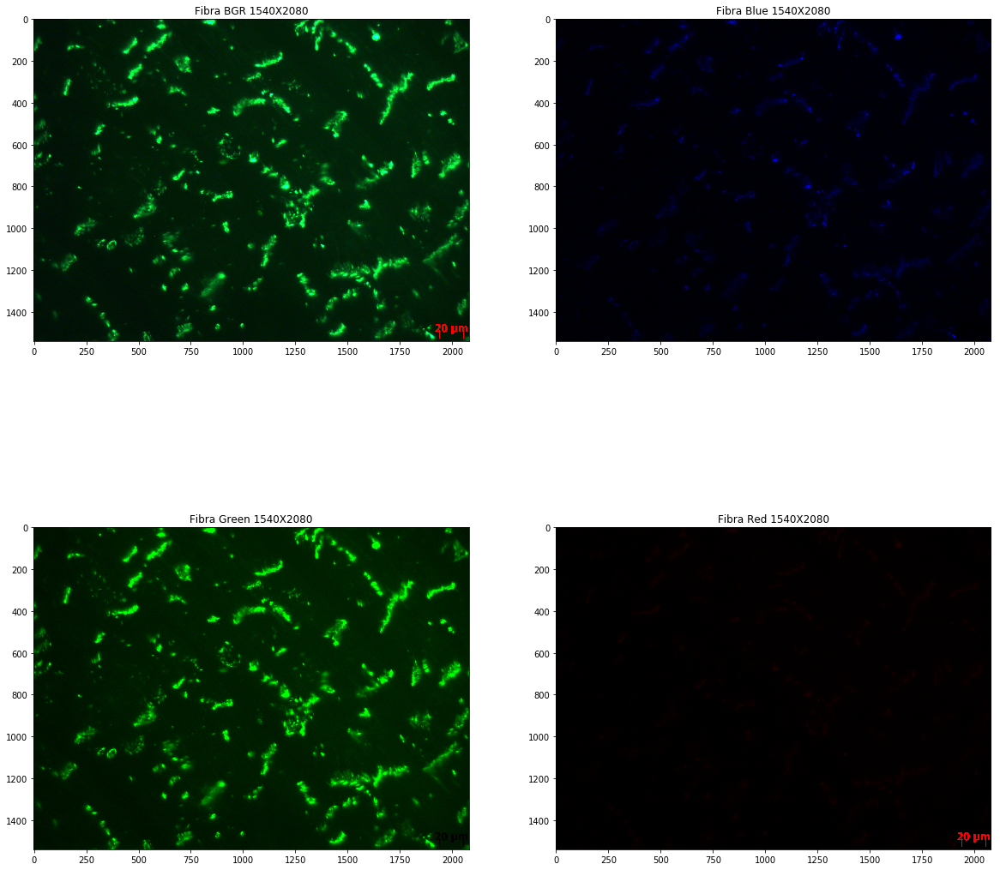

In [59]:
#preservacion de canal rojo
img_red = im1.copy()
img_red[:,:,0]=0#anulo canal azul
img_red[:,:,1]=0#anulo canal verde
print("La imagen mide %sX%s pixeles y tiene %s canales\n"%(img_red.shape))
#preservacion del canal azul
img_blue = im1.copy()
img_blue[:,:,1]=0 #anulo canal verde
img_blue[:,:,2]=0 #anulo canal rojo
print("La imagen mide %sX%s pixeles y tiene %s canales\n"%(img_blue.shape))
#preservacion del canal verde
img_green = im1.copy()
img_green[:,:,0]=0 #anulo canal azul
img_green[:,:,2]=0 #anulo canal rojo
print("La imagen mide %sX%s pixeles y tiene %s canales\n"%(img_green.shape))

plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(im1[:,:,::-1]),plt.title("Fibra BGR %sX%s"%(im1.shape[0:2]))
plt.subplot(2,2,2)
plt.imshow(img_blue[:,:,::-1]),plt.title("Fibra Blue %sX%s"%(im1.shape[0:2]))
plt.subplot(2,2,3)
plt.imshow(img_green[:,:,::-1]),plt.title("Fibra Green %sX%s"%(im1.shape[0:2]))
plt.subplot(2,2,4)
plt.imshow(img_red[:,:,::-1]),plt.title("Fibra Red %sX%s"%(im1.shape[0:2]));

# Pre-Procesamiento de Dataset
Dada la forma en la que se estructura el trabajo con redes profundas, es necesario definir un tamaño fijo de entrada a la red, es decir se tendrá un **batch** de x imágenes las cuales cada una de ellas tendrá la misma dimensión. el peor caso posible supone, que en el dataset las imágenes tendrán no solo un tamaño variable sino que además una relación de aspecto muy diferente, por lo que podremos encontrar, imágenes cuadradas y rectangulares tanto más largas que anchas o viceversa. Sin embargo esta no es la única problemática, la memoria es limitada y el dataset suele ser muy amplio por lo que es recomendable trabajar con imagenes chicas (250x250) sobre todo si el dataset será aumentado con técnicas de preprocesamiento como este caso.

Para lidiar con esta problemática se crea un dataset ficticio que presente la mayor generalidad de relaciones de aspectos y a su vez incluya el caso más favorable, una imagen cuadrada. En este dataset se tienen imágenes patrón que luego funcionaran para probar los algoritmos de preprocesamiento, principalmente rotación y extracción de zonas de interés denominadas *roi(region of interest)*,los cuales permitirán aumentar el dataset para mejorar la performance de entrenamiento en la red.

## Tamaño de imagen.

### Resampleo con cv2.resize()
A continuación se muestra un script en el cual se pueden apreciar las consecuencias de forzar un tamaño de imagen, para empezar se pierde calidad en la imagen, dado que es necesario realizar un resampleo de la misma. a su vez las imágenes se distorsionan, puesto que la cifra colocado muy  probablemente no corresponda a la relación de aspecto de la misma, sobre todo si se la fuerza a ser cuadrada. El problema de esta distorsión es que se está alterando  falseando notablemente la información. En una aplicación donde la morfología de la imagen sea crucial, un aprendizaje con este tipo de distorsión puede resultar deficiente. Por lo que este método de resampleo quedaría descartado. 

en el script, el usuario puede modificar los valores de alto y largo de salida, en las imágenes para apreciar los efectos de distorsión. En este caso se opta por un valor convencional para entrenamiento de redes,250X250. notese como las unicas imagenes que no sufren distorsion son las cuadradas, independientemente de su valor. esto se debe a que se esta moficando de forma proporcional el tamaño de la misma sin alterar su relacion de aspecto, razon por la cual es una gran motivacion el utilizar imagenes cuadras a la hora de entrenar estas redes


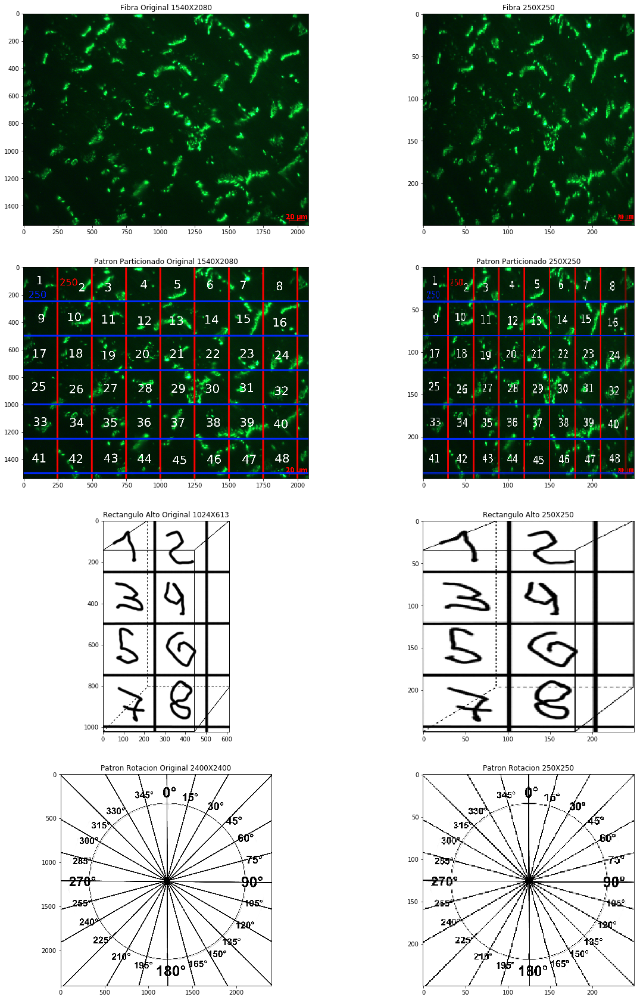

In [60]:
alto = 250
largo = 250

output_shape = (alto,largo)

im1 = cv2.imread("i2.tif")
im2 = cv2.imread("patron_desp.png")
im3 = cv2.imread("hrect.jpg")
im4 = cv2.imread("compass_15.png")

plt.figure(figsize=(20,30))
plt.subplot(4,2,1)
plt.imshow(im1[:,:,::-1]),plt.title("Fibra Original %sX%s"%(im1.shape[0:2]))
plt.subplot(4,2,2)
plt.imshow(cv2.resize(im1[:,:,::-1],output_shape)),plt.title("Fibra %sX%s"%output_shape);
plt.subplot(4,2,3)
plt.imshow(im2[:,:,::-1]),plt.title("Patron Particionado Original %sX%s"%(im2.shape[0:2]))
plt.subplot(4,2,4)
plt.imshow(cv2.resize(im2[:,:,::-1],output_shape)),plt.title("Patron Particionado %sX%s"%output_shape)
plt.subplot(4,2,5)
plt.imshow(im3[:,:,::-1]),plt.title("Rectangulo Alto Original %sX%s"%(im3.shape[0:2]))
plt.subplot(4,2,6)
plt.imshow(cv2.resize(im3[:,:,::-1],output_shape)),plt.title("Rectangulo Alto %sX%s"%output_shape)
plt.subplot(4,2,7)
plt.imshow(im4[:,:,::-1]),plt.title("Patron Rotacion Original %sX%s"%(im4.shape[0:2]));
plt.subplot(4,2,8)
plt.imshow(cv2.resize(im4[:,:,::-1],output_shape)),plt.title("Patron Rotacion %sX%s"%output_shape);


### Grid-crop
Dado la naturaleza del problema y que las imágenes que se van a tratar presentan una característica homogénea, se plantea resolver no solo la problematica de obtencion de **imagenes fijas** sino que ademas parte de la **aumentacion del dataset para mayor generalización**,mediante una técnica de **grid-crop**. Grid crop consiste en establecer una grilla de $nxm$ píxeles, los cuales se distribuyen a lo largo de toda la imagen, luego se definen regiones de interés *roi’s* y se las extrae haciendo uso de un algoritmo compuesto de un doble for, de este modo se muestrea la mayor cantidad de área posible(quedando un remanente). así a partir de una imagen y con este particionado pueden extraerse una cantidad mayor de ejemplos. lógicamente el particionado es conveniente que sea cuadrado y de menor área posible para el funcionamiento de la red, nuevamente se lo toma de 250x250, dado que la imagen patrón que verifica el funcionamiento del algoritmo,posee una grilla hecha y medida a mano de dichas dimensiones,donde cada *roi* es etiquetada y asignada con un numero.

In [61]:
##################codigo######################################
def grid_crop_test(im,out_size=250,resolution = 1):
    tiles = []
    (h,w) = im.shape[0:2]
    out_size = 250
    rows = 0
    resolution = 1
    for y in range(0,h,out_size//resolution):
        rows = rows+1
        for x in range(0, w, out_size//resolution):
            y1 = y + out_size
            x1 = x + out_size
            n_img = im[y:y1,x:x1,:]
            if n_img.shape[:2] == (out_size,out_size):
                tiles.append(n_img)
    return np.stack(tiles),rows #convierto a tensor,devulevo la cantidad de columnas


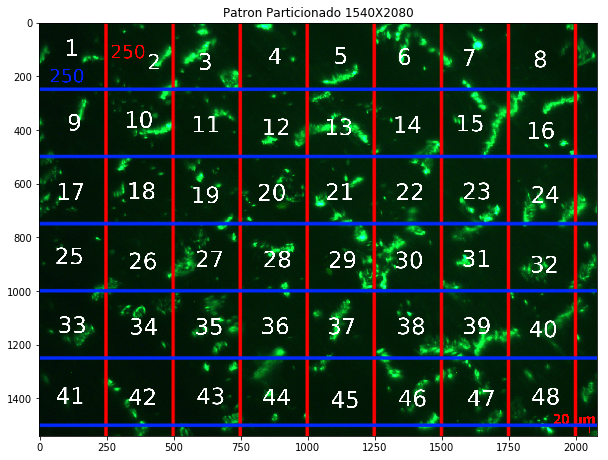

In [62]:
pat_desp_image1 = cv2.imread("patron_desp.png")
pat_desp_image2 = cv2.imread("hrect.jpg")

pat_desp = pat_desp_image1

plt.figure(figsize=(10,10))
plt.imshow(pat_desp[:,:,::-1]),plt.title("Patron Particionado %sX%s"%(pat_desp.shape[0:2]));

Recuerde que las Imagenes se Listan del Numero 1 al 48



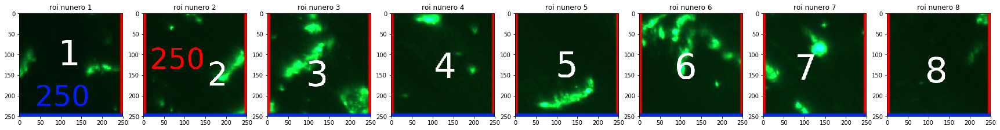

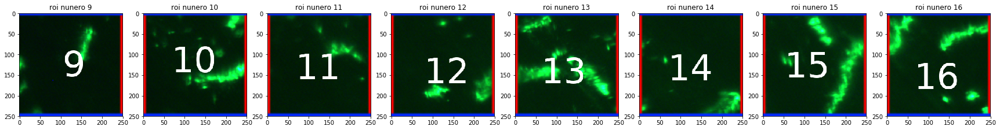

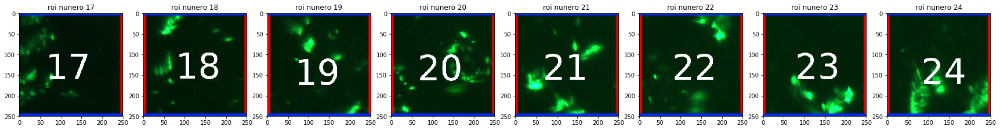

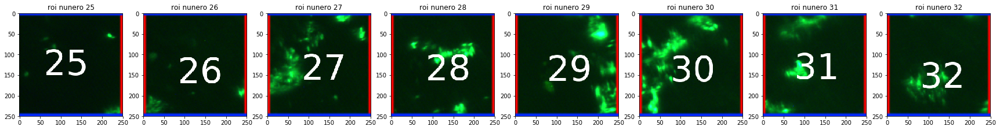

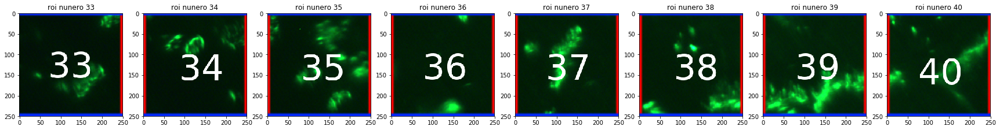

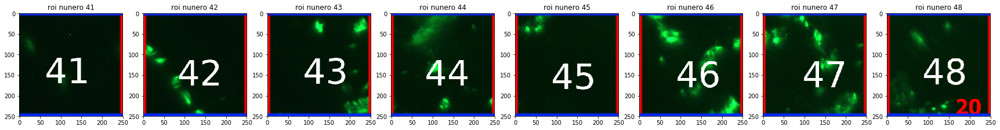

In [63]:
tamanio_de_salida = 250 



tiles,tot_rows = grid_crop_test(pat_desp,out_size=tamanio_de_salida,resolution=1)
tot_rows = tot_rows + 1
img_list = (np.ones(tiles.shape[0])*0).astype(int)
#descomentar y ejecutar para salvar todas las imagenes en una carpeta temp_oriog
#for i in range(0,tiles.shape[0]):
#    j = i+1
#    cv2.imwrite(os.path.join('temp_orig' , '%s_croped.jpg'%j), tiles[i])

######display purpose#####
for i in range(0,tiles.shape[0]):
    img_list[i]=i+1

j=0
flag_plot = 1
labels = np.array(img_list)
print("Recuerde que las Imagenes se Listan del Numero 1 al %s\n"%tiles.shape[0])
for i in range(0,labels.shape[0]):
    if(labels[i]<=tiles.shape[0]) and labels[i]>0:
        if flag_plot:
            plt.figure(figsize=(30,5))
            flag_plot = 0
        if(j<tot_rows):
            plt.subplot(1,tot_rows,j+1),plt.imshow(tiles[labels[i]-1][:,:,::-1]),plt.title("roi nunero %s"%(labels[i]))
            j = j+1
            if(j>=tot_rows):
                flag_plot = 1
                j=0
    else:   
        print("La Imagen numero %s que Usted Selecciono se Encuentra Fuera de Rango,Dispone de %s Imagenes\n"%
                (labels[i],tiles.shape[0]))
##################codigo######################################
del labels
del img_list

# Rotación

## Problema con matriz Rotación

Para realizar una rotación, es necesario aplicar una transformación lineal, sobre la imagen, en este [tutorial](https://docs.opencv.org/trunk/da/d6e/tutorial_py_geometric_transformations.html) se explica mas detalladamente  y en la [Documentacion de openCV](https://docs.opencv.org/2.4/modules/imgproc/doc/geometric_transformations.html?highlight=warpaffine),se aborda de forma mas teorica.El siguiente código, simplemente toma una imagen y aplica una rotación según el angulo indicado en grados, dicha rotación se realiza en sentido horario tomando como centro, el punto medio de la imagen a rotar. 

In [64]:
def rotate_around_center(image,angle):
    # grab the dimensions of the image and then determine the
    # center
    (h, w) = image.shape[:2]
    (cX, cY) = (w // 2, h // 2)
    # (i.e., the rotation components of the matrix)
    M = cv2.getRotationMatrix2D((cX, cY), angle, 1.0)
    return cv2.warpAffine(image, M, (w, h))

Si aplicamos las transformaciones directamente, por la forma en la que se estructura el algoritmo, se tiene como resultado, no solo un recorte en la imagen original, sino que a su vez la aparición de un fondo o negro o **padding** para cubrir los puntos que no fueron mapeados correctamente o que cayeron fuera de la circunferencia inscrita. A continuación se muestra una animación, mostrando este efecto, indeseable para nuestra aplicación. Nótese, que el efecto resulta máximo cuando la imagen alcanza un valor de **45** grados, resultado en aproximadamente un 30% de padding y un 50% de área efectiva. A fines de verificar la rotación del algoritmo, se trazan las bisectrices de la imagen y se busca que en la imagen patrón, las líneas verdes intersectan a las líneas negras, que marcan la cantidad de grados que se roto la imagen.

In [65]:
image = cv2.imread("compass_15.png")
fig = plt.figure(figsize=(10,10));
lineThickness = 10
paso_angulo = 15
ims = []
for i in range(0,360+paso_angulo,paso_angulo):
    data = rotate_around_center(image,angle = i)
    (h,w) = data.shape[0:2]
    cv2.line(data, (0, h//2), (w, h//2), (0,255,0), lineThickness) #horizontal
    cv2.line(data, (w//2, 0), (w//2, h), (0,255,0), lineThickness)
    ttl = plt.text(w//2, -20, "Rotacion de %sº a pasos de %sº"%(i,paso_angulo),horizontalalignment='center', verticalalignment='bottom')
    ims.append([plt.imshow(data[:,:,::-1]),ttl]);
    #cv2.imwrite(os.path.join('temp_orig' , '%sº_rotrated.jpg'%i), data)
    
ani = animation.ArtistAnimation(fig, ims, interval=250, blit=False,repeat_delay=10);
plt.close(fig);
# ani.save('dynamic_images.mp4')

HTML(ani.to_jshtml())
#plt.show()

# Optimizacion Rotación
Como solución al problema del padding, se propone el uso de un algoritmo matemático el cual consiste en encontrar el mayor rectángulo inscripto en un rectángulo rotado, a fin de establecer los valores X,Y de la imagen de salida que **maximizan el área efectiva**. El algoritmo puede encontrarse en cualquier sitio de internet,para nuestros fines es útil para saber cuánto de la imagen podemos obtener sin caer en una zona de **padding**. Una vez que se obtienen los tamaños de dicho rectángulo, se toma una roi, desde el centro de la imagen, utilizando dichas dimensiones previamente computadas, de esta forma se pierde área, pero se soluciona el problema de padding.

In [66]:
def rotatedRectWithMaxArea(w, h, angle):
  """
  Given a rectangle of size wxh that has been rotated by 'angle' (in
  radians), computes the width and height of the largest possible
  axis-aligned rectangle (maximal area) within the rotated rectangle.
  """
  if w <= 0 or h <= 0:
    return 0,0

  width_is_longer = w >= h
  side_long, side_short = (w,h) if width_is_longer else (h,w)

  # since the solutions for angle, -angle and 180-angle are all the same,
  # if suffices to look at the first quadrant and the absolute values of sin,cos:
  sin_a, cos_a = abs(math.sin(angle)), abs(math.cos(angle))
  if side_short <= 2.*sin_a*cos_a*side_long or abs(sin_a-cos_a) < 1e-10:
    # half constrained case: two crop corners touch the longer side,
    #   the other two corners are on the mid-line parallel to the longer line
    x = 0.5*side_short
    wr,hr = (x/sin_a,x/cos_a) if width_is_longer else (x/cos_a,x/sin_a)
  else:
    # fully constrained case: crop touches all 4 sides
    cos_2a = cos_a*cos_a - sin_a*sin_a
    wr,hr = (w*cos_a - h*sin_a)/cos_2a, (h*cos_a - w*sin_a)/cos_2a

  return wr,hr

def crop_around_center(image, width, height):
    """
    Given a NumPy / OpenCV 2 image, crops it to the given width and height,
    around it's centre point
    """

    image_size = (image.shape[1], image.shape[0])
    image_center = (int(image_size[0] // 2), int(image_size[1] // 2))

    if(width > image_size[0]):
        width = image_size[0]

    if(height > image_size[1]):
        height = image_size[1]

    x1 = int(image_center[0] - (width //2))
    x2 = int(x1 + width)
    y1 = int(image_center[1] - (height // 2))
    y2 = int(y1 + height)

    return image[y1:y2, x1:x2,:]


# Algoritmo para no padding

Juntando los tres algoritmos anteriores(rotación,cálculo de mayor área efectiva de un rectángulo rotado y la toma de roi central), se propone la siguiente solución, la cual a partir de recibir una imagen, un ángulo que se quiera rotar y el ángulo que se quiere calcular la mayor área efectiva del rectángulo inscripto (usualmente coincidente con el ángulo de rotación), rota la imagen, eliminando el padding y maximizando el área efectiva. Dicha técnica requiere de resamplear la misma,para lo cual puede producirse **distorsión**, el cual es otro efecto indeseado. Sin embargo si las imágenes del dataset son cuadradas y todas se rotan en la misma proporción, **la distorsión que ocurre es proporcional**. Cómo no va a ser el caso de nuestra aplicación, nuevamente es un problema que requiere solucionarse.

In [67]:
def rotate_no_pad(image,angle,crop_angle = 45, output_shape =(250,250)):
#rota una imagen un angulo en grados y tras definir el mejor rectangulo realiza el crop desde ese punto    
    (h, w) = image.shape[:2]
    w_r,h_r = rotatedRectWithMaxArea(w, h, angle=(crop_angle*np.pi)/180)
    #computo imagen rotada,cropeo en torno al mejor rectangulo
    output = crop_around_center(rotate_around_center(image,angle),w_r,h_r)
    
    if output.shape[:2]!=output_shape:
        output = cv2.resize(output,output_shape)
    return output



A continuación se muestra una animación con la solución empleada, nótese como el efecto de distorsión genera un zoom en la imagen cuando esta es rotada una diferente cantidad de grados, preservando la mayor área posible. Obsérvese que nuevamente al rotarse **45 grados** la pérdida de área es máxima. Este método **distorsiona la información**, pero garantiza un **área efectiva máxima**, para cada ángulo de rotación pedido.

In [68]:
pat_rot = cv2.resize(cv2.imread("compass_15.png"),(355,355))

fig = plt.figure(figsize=(5,5));
lineThickness = 2
paso_angulo = 15
ims = []
for i in range(0,360+paso_angulo,paso_angulo):
    data = rotate_no_pad(pat_rot,angle = i,crop_angle=i)
    (h,w) = data.shape[0:2]
    cv2.line(data, (0, h//2), (w, h//2), (0,255,0), lineThickness) #horizontal
    cv2.line(data, (w//2, 0), (w//2, h), (0,255,0), lineThickness)
    ttl = plt.text(w//2, -20, "Rotacion de %sº a pasos de %sº"%(i,paso_angulo),horizontalalignment='center', verticalalignment='bottom')
    ims.append([plt.imshow(data[:,:,::-1]),ttl])
    #cv2.imwrite(os.path.join('temp_orig' , '%sº_rotrated.jpg'%i), data)
    
ani = animation.ArtistAnimation(fig, ims, interval=250, blit=False,repeat_delay=10);
plt.close(fig)
# ani.save('dynamic_images.mp4')

HTML(ani.to_jshtml())
#plt.show()

## Solución al problema de distorsión por rotación.

Dado que lo que se busca en la aplicación es no distorsionar la información por sobre conseguir una mayor área efectiva, se realiza el siguiente procedimiento. Se busca una relación entre el área efectiva de salida denominada $\color{green}Ox\color{green}O$ y convencionalmente tomada como 250X250 px con el tamaño de roi en $NXN$ para una rotación $\color{blue}\varphi$ a fin de determinar qué valor de $NXN$ es necesario para evitar distorsión a la hora de rotar $\color{blue}\varphi$ grados.

La siguiente ilustración muestra el problema a resolver, no existe una relación directa entre $\color{green}Ox\color{green}O$ esta puede ser cualquiera, por ende es necesario asumir un criterio, dado que lo que se busca es no caer en una zona de *padding*. asumimos que el tamaño de $\color{green}Ox\color{green}O$ de interés es coincidente, con el lado menor de la intersección del cuadrado Rotado y el desplazado. De esa forma pueden escribirse las dos ecuaciones que resuelven el problema. 

<img src="./esquema_rotacion.png"/>

\begin{equation}1
\left\{\begin{matrix}
N = \sqrt{a² + b²} +\color{red}d +\color{red}e
\\
N = a +b + \color{green}O
\end{matrix}\right.
\end{equation}

Por lo que ahora es necesario despejar las variables intermedias para encontrar la relación buscada, si observamos entre los lados $\color{red}d$ y $\color{red}e$ se forma un triángulo rectángulo cuya hipotenusa es $\color{green}O$ a su vez en los lados $a,b,\sqrt{a² + b²}$ también se forma un triángulo rectángulo. Al menos esto se cumple hasta los 45 grados, cubriendo el rango necesario, puesto que después los patrones de padding se vuelven a repetir en la imagen, por lo cual es más eficiente plantear un algoritmo sencillo y luego adaptar la entrada a la situación correspondiente. aplicando trigonometría se obtienen las siguientes relaciones:


\begin{equation}2
\left\{\begin{matrix}
\color{red}d = \color{green}O.cos\color{blue}\varphi
\\
\color{red}e = \color{green}O.sin\color{blue}\varphi
\\
\color{red}d + \color{red}e = \color{green}O(cos\color{blue}\varphi + sin\color{blue}\varphi) 
\end{matrix}\right.
\end{equation}


\begin{equation}3
\left\{\begin{matrix}
b = \sqrt{a² + b²}.cos\color{blue}\varphi
\\
a = \sqrt{a² + b²}.sin\color{blue}\varphi
\\
b+a =\sqrt{a² + b²}(cos\color{blue}\varphi + sin\color{blue}\varphi)
\end{matrix}\right.
\end{equation}

Con las ecuaciones planteadas ya es posible resolver el problema, a continuación se detalla el procedimiento realizado hasta encontrarse una solución. como se está hablando de un número positivo(cantidad de pixeles), a modo de seguridad en su implementación se lo fuerza tomando el valor absoluto del mismo. Pueden observarse varios inconvenientes a solucionar con la expresión, matemáticamente no está definida para valores de rotación de 90º 180º 270º y 0º, convenientemente quisiéramos que el tamaño de grilla que se tome sea de $NXN$ en dichas situaciones, a su vez $\color{blue}{\varphi}$ está restringido entre 0 y 45 grados. **Desde un punto de vista geométrico el hecho de que la imagen se rote 46º o 44º representa exactamente lo mismo en términos de área efectiva a extraer**, mas no así en la información, dicha asunción la podemos realizar, porque estamos trabajando con una imagen,posteriormente una roi, cuadrada.  

\begin{equation}4
\left\{\begin{matrix}
N = \sqrt{a² + b²} + \color{green}O(cos\color{blue}\varphi + sin\color{blue}\varphi)
\\
N = \sqrt{a² + b²}.(cos\color{blue}\varphi + sin\color{blue}\varphi) + \color{green}O
\\
\sqrt{a² + b²} =  N - \color{green}O(cos\color{blue}\varphi + sin\color{blue}\varphi)
\\\\
N = [N - \color{green}O(cos\color{blue}\varphi + sin\color{blue}\varphi)].(cos\color{blue}\varphi + sin\color{blue}\varphi) + \color{green}O
\\
N = N(cos\color{blue}\varphi + sin\color{blue}\varphi) - \color{green}O(cos\color{blue}\varphi + sin\color{blue}\varphi)² + \color{green}O
\\
N = N(cos\color{blue}\varphi + sin\color{blue}\varphi) +\color{green}O[-(cos\color{blue}\varphi + sin\color{blue}\varphi)² + 1)]
\\
N = N(cos\color{blue}\varphi + sin\color{blue}\varphi) +\color{green}O[-(cos²\color{blue}\varphi + sin²\color{blue}\varphi + 2sin\color{blue}\varphi.cos\color{blue}\varphi) + 1)]
\\
N = N(cos\color{blue}\varphi + sin\color{blue}\varphi) - 2\color{green}Osin\color{blue}\varphi.cos\color{blue}\varphi
\end{matrix}\right.
\end{equation}

\begin{equation}
N = \left |-\frac{2\color{green}Osin\color{blue}\varphi.cos\color{blue}\varphi}
{1 - (cos\color{blue}\varphi + sin\color{blue}\varphi)} \right |;  0º<\color{blue}\varphi<45º
\end{equation}


Siendo que $\color{blue}\varphi$ es el angulo que va a ingresar el usuario\algoritmo de forma aleatoria y uniforme es peligroso dejar la expresion anterior a manos de dicha aleatoriedad por lo que si la solucion anterior solo funciona para angulos comprendidos entre 0º y 45º y los patrones de padding son ciclicos de forma lineal entre cada cuarto de cuadradante, es mas conveniente escrribir a la solucion anterior como funcion de un nuevo parametro el cual tendra una dependencia con el angulo de entrada $\color{blue}\varphi$ lo llamaremos $\color{red}\theta$:

\begin{equation}
N = \left |-\frac{2\color{green}Osin\color{red}\theta.cos\color{red}\theta}
{1 - (cos\color{red}\theta + sin\color{red}\theta)} \right |;  0º<\color{red}\theta<45º
\end{equation}

\begin{equation}\color{red}\theta = f(\color{blue}\varphi)=
\left\{\begin{matrix}
\color{blue}\varphi &; & 45º>\color{blue}\varphi>0º
\\
-\color{blue}\varphi + 90º&; & 90º>\color{blue}\varphi>45º
\\
-\color{blue}\varphi + 135º&; & 135º>\color{blue}\varphi>90º
\\
-\color{blue}\varphi + 180º&; & 180º>\color{blue}\varphi>135º
\\
-\color{blue}\varphi + 225º&; & 225º>\color{blue}\varphi>180º
\\
-\color{blue}\varphi + 270º&; & 270º>\color{blue}\varphi>225º
\\
-\color{blue}\varphi + 315º&; & 315º>\color{blue}\varphi>270º
\\
-\color{blue}\varphi + 360º&; & 360º>\color{blue}\varphi>315º
\end{matrix}\right.
\end{equation}


\begin{equation}N = f(\color{blue}\varphi,\color{red}\theta,\color{green}O)=
\left\{\begin{matrix}
\left |-\frac{2\color{green}Osin\color{red}\theta.cos\color{red}\theta}
{1 - (cos\color{red}\theta + sin\color{red}\theta)} \right |&;&  0º<\color{red}\theta<45º
\\
\color{green}O &;& \color{blue}\varphi=[0º;90º;180º;270º;360º]
\end{matrix}\right.
\end{equation}

## Algo del código

Si bien no es posible observar el efecto de rotación, esto se debe a que el código simplemente resamplea la imagen original el tamaño de grilla especificado,para luego rotarla. la técnica para la que pretende servir, es para imágenes en las que la información sea completamente homogénea y sea indistinto el tipo de roi de que se tome, siempre y cuando cumpla con las especificaciones necesarias, en este caso, área máxima.

In [69]:
def get_grid_rot_square_size(output_size = 250,phi = 45):
    #calculo el tamaño de grilla a tomar en funcion de la rotacion para tener 
    theta = phi
    o = output_size #de momento el algortimo solo funciona en imagenes cuadradas    
    if(theta==0 or theta==90 or theta==180 or theta == 270 or theta ==360):
        n = o
    else:
    #calculo el tamaño de grilla en funcion de dicha rotacion empleada
    #la unica solucion que me sirve es la de los primeros 45 grados
    #luego se repite, mapeo a la entrada con mi solucion efectiva
        if(phi>45):
            theta = -phi + 90
        if(phi>90):
            theta = -phi + 135
        if(phi>=135):
            theta = -phi + 180
        if(phi>180):
            theta = -phi + 225
        if(phi>=225):
            theta = -phi + 270
        if(phi>270):
            theta = -phi + 315
        if(phi>=315):
            theta = -phi + 360
    #calculo el angulo que representa la cantidad de pixeles a extraer en funcion de dicha rotacion
        angle_rad = (theta*np.pi)/180
        n = np.floor(abs(-(o*2*np.cos(angle_rad)*np.sin(angle_rad))/(1 - (np.cos(angle_rad) + np.sin(angle_rad))))).astype(int)
    return n

In [70]:
pat_rot = cv2.imread("compass_15.png")
o = 500
fig = plt.figure(figsize=(5,5));
lineThickness = 2
paso_angulo = 15
ims = []
for i in range(0,360+paso_angulo,paso_angulo):
    n = get_grid_rot_square_size(output_size=o,phi=i)
    data = crop_around_center(cv2.resize(rotate_around_center(pat_rot,i),(n,n)),o,o)
    
    (h,w) = data.shape[0:2]
    cv2.line(data, (0, h//2), (w, h//2), (0,255,0), lineThickness) #horizontal
    cv2.line(data, (w//2, 0), (w//2, h), (0,255,0), lineThickness)
    ttl = plt.text(w//2, -20, "Rotacion de %sº a pasos de %sº con n=%s"%(i,paso_angulo,n),horizontalalignment='center', verticalalignment='bottom')
    ims.append([plt.imshow(data[:,:,::-1]),ttl])
    #cv2.imwrite(os.path.join('temp_orig' , '%sº_rotrated.jpg'%i), data)
    
ani = animation.ArtistAnimation(fig, ims, interval=250, blit=False,repeat_delay=10);
plt.close(fig)
# ani.save('dynamic_images.mp4')

HTML(ani.to_jshtml())
#plt.show()

## Aumentación de dataset, con técnica de rotación y desplazamiento.

Basándonos en el algoritmo de grid crop y aprovechando la homogeneidad en cada elemento de dataset, se toma una posición de manera uniforme sobre la imagen, dicha posición corresponderá a la esquina superior izquierda de la nueva sub-roi. Comúnmente, en álgebra, el primer elemento de una matriz. basándose en la rotación a emplear, el algoritmo decidirá a partir de dicha coordenada la cantidad de **$NXN$** pixeles a extraer haciendo uso del algoritmo previamente desarrollado, luego la extracción se realizará por medio de indexación de vector en dos dimensiones, ya extraída la roi de **$NXN$** esta se rotará $\color{blue}{\varphi}$ grados a si al tomar la informacion de interes, la imagen final de salida corresponderá a la misma roi buscada, rotada y de tamaño **$\color{green}{O}X\color{green}{O}$**.

En el caso de que la coordenada ingresada, termine resultando en una roi cuya dimensión se encuentra fuera de la imagen principal, el algoritmo simplemente acomoda el primer elemento de la matriz en función de dicha información, si bien es cierto que podría descartarse la coordenada ingresada puesto que se pierde un control, sin embargo esta solución permite rescatar información en las zonas de bordes, que a priori son consideradas como importantes.

Reescribimos el algoritmo de **grid crop** para que realice las tareas pedidas, para ello hacemos uso de los anteriores algoritmos los cuales sabemos que funcionan por su cuenta, a su vez agregamos una protección para garantizar que la imagen salida sea del tamaño especificado y que no ocurra ningún fallo.

A su vez agregamos la función **augmented_data** la cual se encarga de gestionar los recursos de memoria en función de la aumentación del dataset e informar qué condiciones(posicion y angulo), se utilizaron para realizar la aumentación de las nuevas muestras, generadas por una muestra del data set.


In [71]:
def grid_crop(im,out_size = (250,250),dy=0,dx=0,angle = 45):
    "la funcion toma el primer elemento de la matriz y desplaza en las direcciones x,y a su vez rota" 
    (h,w) = im.shape[0:2]
    R = (dy,dx) # valor random donde cae la imagen
    n = get_grid_rot_square_size(output_size=out_size[0],phi=angle)
    #defino el nuevo tamaño de grilla para obtener la imagen de 0x0
    grid_size = (n,n) #tienen que quedar en funcion del angulo
    disp_x = grid_size[1]//2 #cuanto desplazo en X
    disp_y = grid_size[0]//2 #cuanto me desplazo en Y
    
    if(R[1] + grid_size[1] >= w): #caigo en una zona fuera de la imagen en x
        xi = w - grid_size[1]
        xf = w 
    else: #es un punto donde no hay ningun conflicto
        disp_x = R[1] + grid_size[1]
        xi = R[1]
        xf = disp_x
        
    if(R[0] + grid_size[0] >= h): #caigo en una zona fuera de la imagen en x
        yi = h - grid_size[0]
        yf = h
    else: #es un punto donde no hay ningun conflicto
        disp_y = R[0] + grid_size[0]
        yi = R[0]
        yf = disp_y
    
    #esto es para la traslacion, para la rotacion usamos
    
    im_t = im[yi:yf,xi:xf,:] #los rangos truncan y no permiten acceder a posiciones de memorias invalidas
    output = crop_around_center(rotate_around_center(im_t,angle),out_size[0],out_size[1])
    
    if(output.shape[0] != out_size[0] or output.shape[1] != out_size[1]):
        sys.exit("Algo fallo:\n tamaño imagen salida (%s,%s)\n los valores de dx y dy recibidos son (%s,%s)\n se roto %sº" 
                 %(output.shape[0],output.shape[1],R[1],R[0],angle))
    else:
        return output
    
    
def augmented_data(im,out_size = (250,250),k = 1):
    
    tensor_output = np.ones((k,out_size[0],out_size[1],3)).astype(np.uint8)
    angles = np.ones(k).astype(np.uint)
    origins = np.ones((2,k)).astype(np.uint)
    (h,w) = im.shape[0:2]
    angle = 0
    dx = 0
    dy = 0
    for i in range(0,k):
        angle = int(np.random.uniform(0,360)) #despues cuantizar
        angles[i] = angle
        dx = int(np.random.uniform(0,w))
        dy = int(np.random.uniform(0,h))
        origins[0][i] = dy
        origins[1][i] = dx
        tensor_output[i] = grid_crop(im,out_size=out_size,dy=dy,dx=dx,angle=angle)
    else:
        return tensor_output,angles,origins



Con esta técnica, el hecho de perder area efectiva, no es un problema, puesto que al momento de realizar rotaciones, tomamos rois más grandes y tantas rois como queramos. de esta forma aumentamos el dataset con información “nueva”. para cualquier tipo de rotación el tamaño de salida de la imagen ser ale especificado(250px en este caso), sin distorsión por resampleo. por lo que a su vez el problema de resampleo queda solucionado, a continuación se muestra un ejemplo de un elemento del dataset  aumentado con rotaciones y traslaciones. Notese la cantidad de imágenes obtenidas a partir de una sola. Dicha augmentacion puede ser teóricamente infinita y conformará el set de datos que entrara a la red que se busque entrenar.


Recuerde que las Imagenes se Listan del Numero 1 al 32

La cantidad de imagenes generadas es de 32 imagenes


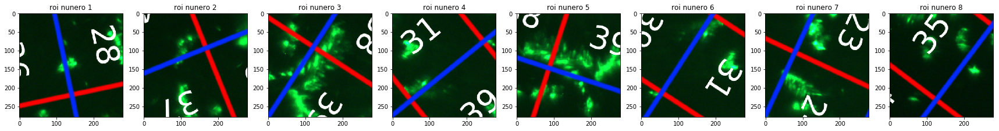

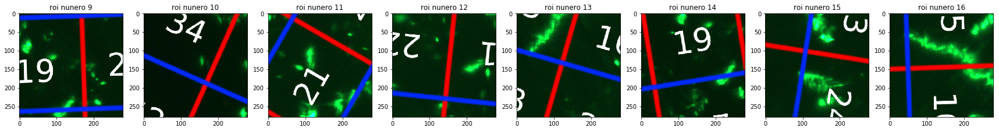

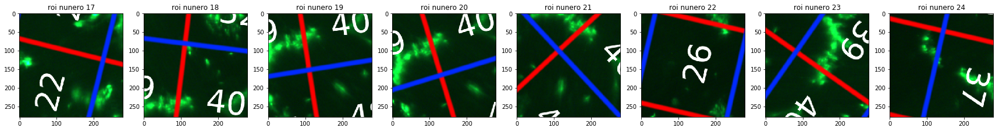

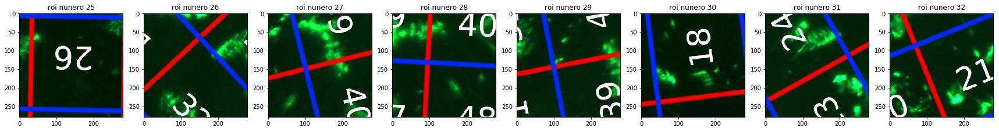

In [76]:
pat_desp_image1 = cv2.imread("patron_desp.png")

cantidad_nuevas_imagenes = (8*4)

pat_desp = pat_desp_image1

(h,w) = pat_desp.shape[0:2]
tensor,angles,origins = augmented_data(pat_desp,out_size=(279,279),k= cantidad_nuevas_imagenes)

#for i in range(0,tensor.shape[0]):
#    j = i+1
#    cv2.imwrite(os.path.join('temp_orig' , '%s_augmented_rot_%sº_orig_(y,x)=(%s,%s).jpg'%
#                             (j,angles[i],origins[0][i],origins[1][i])),tensor[i])


img_list = (np.ones(tensor.shape[0])*0).astype(int)
######display purpose#####
for i in range(0,tensor.shape[0]):
    img_list[i]=i+1

tot_rows = 8
cantidad_imagenes = 0
j=0
flag_plot = 1
labels = np.array(img_list)
print("Recuerde que las Imagenes se Listan del Numero 1 al %s\n"%labels.shape[0])
cantidad_imagenes = cantidad_imagenes + labels.shape[0]
for i in range(0,labels.shape[0]):
    if(labels[i]<=tensor.shape[0]) and labels[i]>0:
        if flag_plot:
            plt.figure(figsize=(30,5))
            flag_plot = 0
        if(j<tot_rows):
            plt.subplot(1,tot_rows,j+1),plt.imshow(tensor[labels[i]-1][:,:,::-1]),plt.title("roi nunero %s"%(labels[i]))
            j = j+1
            if(j>=tot_rows):
                flag_plot = 1
                j=0
    else:   
        print("La Imagen numero %s que Usted Selecciono se Encuentra Fuera de Rango,Dispone de %s Imagenes\n"%
                (labels[i],tensor.shape[0]))
print("La cantidad de imagenes generadas es de %s imagenes"%cantidad_imagenes)